# Amazon Sales Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from pandas_profiling import ProfileReport
from pandas_profiling.profile_report import ProfileReport

In [ ]:
sales_data = pd.read_csv(r'D:\2\STUDY\data analyst\intern project\SALESDATA.csv', parse_dates=['DateKey','Invoice Date', 'Promised Delivery Date'])

In [5]:
sales_data.head()

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,...,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,U/M,Unnamed: 20,Unnamed: 21
0,10000481,2017-04-30,-237.91,2017-04-30,100012,NaN,NaN,Urban Large Eggs,2000,0.00,...,237.91,0.00,0.0,237.91,237.910000,1,184,EA,NaN,U/M = unit of measure
1,10002220,2017-07-14,368.79,2017-07-14,100233,P01,20910,Moms Sliced Turkey,1000,824.96,...,456.17,824.96,0.0,456.17,456.170000,1,127,EA,NaN,NaN
2,10002220,2017-10-17,109.73,2017-10-17,116165,P01,38076,Cutting Edge Foot-Long Hot Dogs,1000,548.66,...,438.93,548.66,0.0,438.93,438.930000,1,127,EA,NaN,EA = each
3,10002489,2017-06-03,-211.75,2017-06-03,100096,NaN,NaN,Kiwi Lox,1000,0.00,...,211.75,0.00,0.0,211.75,211.750000,1,160,EA,NaN,NaN
4,10004516,2017-05-27,96627.94,2017-05-27,103341,P01,60776,High Top Sweet Onion,1000,408.52,...,89248.66,185876.60,0.0,89248.66,196.150901,455,124,SE,NaN,SE = some SI unit like kgs or gallons


First 5 records of dataset.

In [6]:
sales_data.shape

(65282, 22)

There are 65282 rows and 22 columns in the dataset.

In [7]:
#List columns in dataset

sales_data.columns

Index(['CustKey', 'DateKey', 'Discount Amount', 'Invoice Date',
       'Invoice Number', 'Item Class', 'Item Number', 'Item', 'Line Number',
       'List Price', 'Order Number', 'Promised Delivery Date', 'Sales Amount',
       'Sales Amount Based on List Price', 'Sales Cost Amount',
       'Sales Margin Amount', 'Sales Price', 'Sales Quantity', 'Sales Rep',
       'U/M', 'Unnamed: 20', 'Unnamed: 21'],
      dtype='object')

In [8]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65282 entries, 0 to 65281
Data columns (total 22 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   CustKey                           65282 non-null  int64         
 1   DateKey                           65282 non-null  datetime64[ns]
 2   Discount Amount                   65280 non-null  float64       
 3   Invoice Date                      65282 non-null  datetime64[ns]
 4   Invoice Number                    65282 non-null  int64         
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65241 non-null  object        
 7   Item                              65282 non-null  object        
 8   Line Number                       65282 non-null  int64         
 9   List Price                        65282 non-null  float64       
 10  Order Number                      65282 non-nu

The dataset contains type Integer, Date-Time, Float and Object type data.

In [9]:
#count number of missing values in dataset.

sales_data.isnull().sum()

CustKey                                 0
DateKey                                 0
Discount Amount                         2
Invoice Date                            0
Invoice Number                          0
Item Class                           8289
Item Number                            41
Item                                    0
Line Number                             0
List Price                              0
Order Number                            0
Promised Delivery Date                  0
Sales Amount                            0
Sales Amount Based on List Price        0
Sales Cost Amount                       0
Sales Margin Amount                     0
Sales Price                             1
Sales Quantity                          0
Sales Rep                               0
U/M                                     0
Unnamed: 20                         65282
Unnamed: 21                         65278
dtype: int64

Item Class and Item Number contain null values.

In [10]:
sales_data1 = sales_data.copy()

In [11]:
sales_data1['Item Class'].value_counts()

P01    56977
PO1       16
Name: Item Class, dtype: int64

In [12]:
sales_data1.drop(['Unnamed: 20','Unnamed: 21'],axis=1,inplace= True)

Drop unnecessary columns.

In [13]:
sales_data1.describe()

,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Order Number,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
count,6.528200e+04,65280.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65281.000000,65282.000000,65282.000000
mean,1.001770e+07,1855.574835,216223.662020,23713.849790,514.693380,180583.064352,2852.038373,4707.473613,1660.979228,1191.059145,283.615913,45.084311,137.422398
std,7.176148e+03,9037.140888,94992.281866,32664.024053,449.189182,67593.871116,15164.342107,20696.443785,9556.485250,5860.787502,252.876719,429.661793,26.643936
min,1.000045e+07,-255820.800000,100012.000000,1000.000000,0.000000,100838.000000,200.010000,0.000000,0.000000,-3932.930000,-5000.000000,-1.000000,103.000000
25%,1.001272e+07,246.037500,117931.000000,3000.000000,181.560000,115321.000000,308.387500,561.040000,167.790000,129.950000,100.070000,2.000000,113.000000
50%,1.001966e+07,441.760000,222869.500000,12000.000000,325.190000,203702.000000,553.940000,998.160000,304.500000,246.490000,183.757500,3.000000,134.000000
75%,1.002351e+07,999.760000,314318.750000,32000.000000,803.860000,218576.000000,1280.042500,2315.040000,687.320000,579.530000,448.220000,8.000000,160.000000
max,1.002758e+07,343532.660000,332842.000000,344000.000000,2760.700000,321532.000000,555376.000000,632610.160000,366576.000000,188800.000000,6035.000000,16000.000000,185.000000


In [14]:
sales_data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65282 entries, 0 to 65281
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   CustKey                           65282 non-null  int64         
 1   DateKey                           65282 non-null  datetime64[ns]
 2   Discount Amount                   65280 non-null  float64       
 3   Invoice Date                      65282 non-null  datetime64[ns]
 4   Invoice Number                    65282 non-null  int64         
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65241 non-null  object        
 7   Item                              65282 non-null  object        
 8   Line Number                       65282 non-null  int64         
 9   List Price                        65282 non-null  float64       
 10  Order Number                      65282 non-nu

In [15]:
sales_data1['Invoice_Year']= sales_data['Invoice Date'].dt.year
sales_data1['Invoice_Month']= sales_data['Invoice Date'].dt.month
sales_data1['Invoice_Quarter']= sales_data['Invoice Date'].dt.quarter
sales_data1['Invoice_Day']= sales_data['Invoice Date'].dt.day

In [16]:
sales_data2 = sales_data1[['CustKey', 'Item','Invoice Date','Invoice_Year','Invoice_Quarter','Invoice_Month','Invoice_Day',
                          'Sales Quantity','Sales Amount','Sales Amount Based on List Price','Discount Amount','Sales Margin Amount',
                          'Sales Cost Amount','Sales Rep','U/M','List Price','Sales Price']]

In [17]:
sales_data2.isnull().sum()

CustKey                             0
Item                                0
Invoice Date                        0
Invoice_Year                        0
Invoice_Quarter                     0
Invoice_Month                       0
Invoice_Day                         0
Sales Quantity                      0
Sales Amount                        0
Sales Amount Based on List Price    0
Discount Amount                     2
Sales Margin Amount                 0
Sales Cost Amount                   0
Sales Rep                           0
U/M                                 0
List Price                          0
Sales Price                         1
dtype: int64

In [ ]:
sales_data2.dropna(subset=['Discount Amount','Sales Price'],axis=0,inplace=True)

In [19]:
sales_data2.isnull().sum()

CustKey                             0
Item                                0
Invoice Date                        0
Invoice_Year                        0
Invoice_Quarter                     0
Invoice_Month                       0
Invoice_Day                         0
Sales Quantity                      0
Sales Amount                        0
Sales Amount Based on List Price    0
Discount Amount                     0
Sales Margin Amount                 0
Sales Cost Amount                   0
Sales Rep                           0
U/M                                 0
List Price                          0
Sales Price                         0
dtype: int64

<AxesSubplot:>

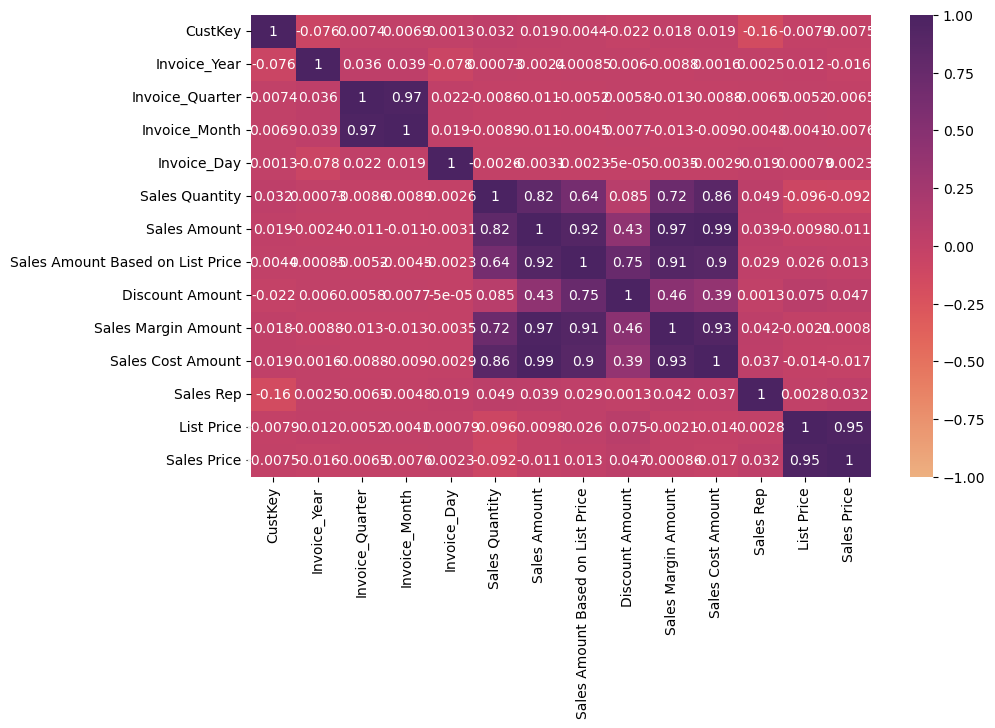

In [20]:
plt.figure(figsize=(10,6))
sns.heatmap(sales_data2.corr(method='pearson'),annot=True, vmin=-1, vmax=1, cmap='flare')

From above plotting we can conclude that,

1. Sales Amount is highly related to Sales Cost Amount followed by Sales Margin Amount and Sales Amount Based on List Price.
2. Also, we can see slight relation of Discount Amount with Sales Cost and Sales Margin Amount.
3. List Price and Sales Cost Amount show least correlation.

In [21]:
sales_data2.head()

,CustKey,Item,Invoice Date,Invoice_Year,Invoice_Quarter,Invoice_Month,Invoice_Day,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,U/M,List Price,Sales Price
0,10000481,Urban Large Eggs,2017-04-30,2017,2,4,30,1,237.91,0.00,-237.91,237.91,0.0,184,EA,0.00,237.910000
1,10002220,Moms Sliced Turkey,2017-07-14,2017,3,7,14,1,456.17,824.96,368.79,456.17,0.0,127,EA,824.96,456.170000
2,10002220,Cutting Edge Foot-Long Hot Dogs,2017-10-17,2017,4,10,17,1,438.93,548.66,109.73,438.93,0.0,127,EA,548.66,438.930000
3,10002489,Kiwi Lox,2017-06-03,2017,2,6,3,1,211.75,0.00,-211.75,211.75,0.0,160,EA,0.00,211.750000
4,10004516,High Top Sweet Onion,2017-05-27,2017,2,5,27,455,89248.66,185876.60,96627.94,89248.66,0.0,124,SE,408.52,196.150901


In [22]:
sales_data2.tail()

,CustKey,Item,Invoice Date,Invoice_Year,Invoice_Quarter,Invoice_Month,Invoice_Day,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,U/M,List Price,Sales Price
65277,10017638,High Top Oranges,2018-03-21,2018,1,3,21,9,569.90,1075.68,505.78,329.95,239.95,180,EA,119.52,63.322222
65278,10017638,Landslide White Sugar,2018-03-21,2018,1,3,21,2,462.81,873.56,410.75,39.26,423.55,180,EA,436.78,231.405000
65279,10017638,Moms Potato Salad,2018-03-21,2018,1,3,21,8,987.20,1863.36,876.16,413.20,574.00,180,EA,232.92,123.400000
65280,10017638,Better Fancy Canned Sardines,2018-03-21,2018,1,3,21,36,27297.51,51524.28,24226.77,11108.61,16188.90,180,EA,1431.23,758.264167
65281,10017638,Imagine Popsicles,2018-03-21,2018,1,3,21,48,27582.02,52061.28,24479.26,13347.80,14234.22,180,EA,1084.61,574.625417


In [23]:
sales_data2.shape

(65280, 17)

In [24]:
#count number of values in each column

sales_data2.Item.value_counts()

Better Fancy Canned Sardines    1648
Ebony Prepared Salad            1471
Moms Sliced Turkey              1192
Imagine Popsicles               1191
Discover Manicotti              1126
                                ... 
Fast Salted Pretzels               1
Great Bagels                       1
Imagine Frozen Cauliflower         1
Jeffers Corn Puffs                 1
Bravo Fancy Canned Sardines        1
Name: Item, Length: 657, dtype: int64

In [25]:
#describe data

sales_data2.describe()

,CustKey,Invoice_Year,Invoice_Quarter,Invoice_Month,Invoice_Day,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,6.528000e+04,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000
mean,1.001770e+07,2017.960907,2.414246,6.307001,16.155898,45.085708,2852.043002,4707.617837,1855.574835,1191.012887,1661.030116,137.423192,514.709149,283.696851
std,7.176244e+03,0.946607,1.160954,3.563558,8.795338,429.668301,15164.569043,20696.744425,9037.140888,5860.857507,9556.627220,26.643926,449.187029,252.031660
min,1.000045e+07,2017.000000,1.000000,1.000000,1.000000,1.000000,200.010000,0.000000,-255820.800000,-3932.930000,0.000000,103.000000,0.000000,0.337341
25%,1.001272e+07,2017.000000,1.000000,3.000000,9.000000,2.000000,308.380000,561.040000,246.037500,129.947500,167.790000,113.000000,181.560000,100.070000
50%,1.001966e+07,2018.000000,2.000000,6.000000,16.000000,3.000000,553.940000,998.160000,441.760000,246.490000,304.530000,134.000000,325.190000,183.758250
75%,1.002351e+07,2019.000000,3.000000,9.000000,24.000000,8.000000,1279.987500,2316.630000,999.760000,579.390000,687.400000,160.000000,803.860000,448.220000
max,1.002758e+07,2019.000000,4.000000,12.000000,31.000000,16000.000000,555376.000000,632610.160000,343532.660000,188800.000000,366576.000000,185.000000,2760.700000,6035.000000


In [26]:
profile = ProfileReport(sales_data2,explorative=True, dark_mode=True)

In [27]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#first 16 records of selected columns

sales_data2[[ 'List Price','Sales Price','Sales Amount Based on List Price','Sales Amount','Discount Amount']].head(16)

,List Price,Sales Price,Sales Amount Based on List Price,Sales Amount,Discount Amount
0,0.0000,237.910000,0.0000,237.91,-237.9100
1,824.9600,456.170000,824.9600,456.17,368.7900
2,548.6600,438.930000,548.6600,438.93,109.7300
3,0.0000,211.750000,0.0000,211.75,-211.7500
4,408.5200,196.150901,185876.6000,89248.66,96627.9400
5,0.0000,1950.000000,0.0000,1950.00,-1950.0000
6,795.3140,424.300000,795.3140,424.30,371.0140
7,575.0000,270.960000,1150.0000,541.92,608.0800
8,51.8800,23.560000,778.2000,353.40,424.8000
9,412.0300,187.150000,24721.8000,11229.00,13492.8000


yearly


In [36]:
Yearly_Sales =  sales_data2[['CustKey','Item','Invoice Date','Invoice_Year','Invoice_Month',
                            'Sales Quantity', 'Sales Amount Based on List Price','Discount Amount',
                           'Sales Amount', 'Sales Margin Amount','Sales Cost Amount','Sales Rep','U/M','List Price',
                           'Sales Price']]

,Invoice_Year,Sales Amount
0,2017,87457304.54
1,2018,20817471.00
2,2019,77906591.65


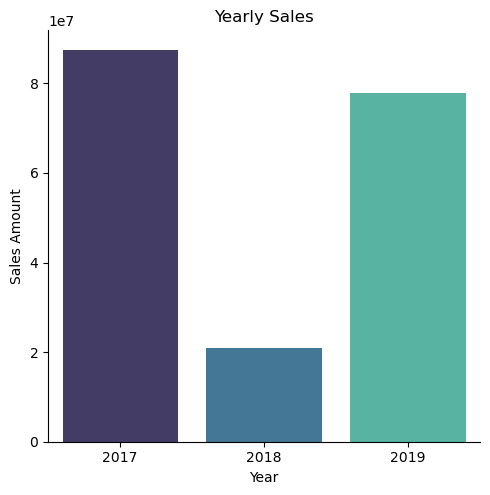

In [47]:
Yearly_Sales01 = Yearly_Sales.groupby('Invoice_Year').sum().reset_index()
sns.catplot(y = 'Sales Amount', x = 'Invoice_Year', data = Yearly_Sales01, palette='mako',kind="bar")
plt.xlabel('Year')
plt.ylabel('Sales Amount')
plt.title('Yearly Sales')
Yearly_Sales01[['Invoice_Year', 'Sales Amount']]

Above yearly graph gives us an overview on the sales amount attained in the given years. 2017 has highest sales followed by year 2019 and then 2018. The table given above the graph depicts the amount hitted in that particular year. 

<Figure size 1500x500 with 0 Axes>

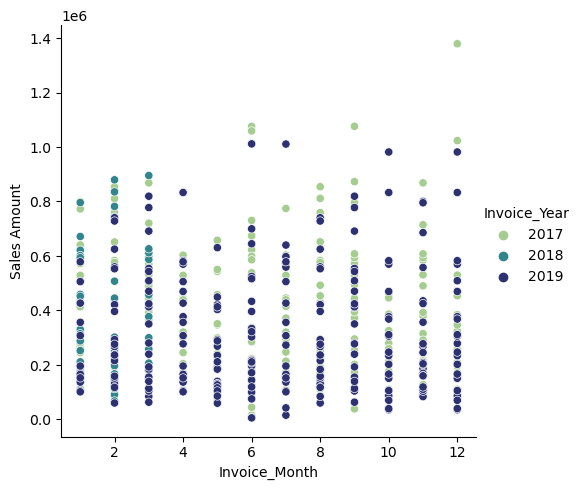

In [49]:
plt.figure(figsize = (15,5))
sns.relplot(y ='Sales Amount', x = 'Invoice_Month',
             data= sales_data2.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),
             hue = 'Invoice_Year', palette='crest')

The above bar graph illustrates the Montly sales amount in each year.
1. Major sales done in all months is in year 2019 followed by year 2018.
2. Year 2018 has least sales amount.
3. Year 2019 has rising amount rate in initial months of the year as compared to last quarter.
4. Year 2017 has most sales amount in last quarter of the year.

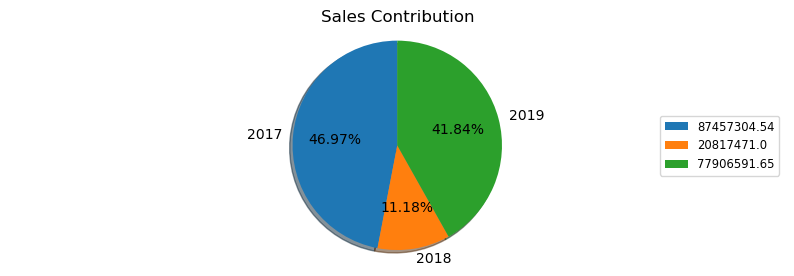

In [53]:
plt.figure(figsize=(10,3))
plt.pie('Sales Amount',labels='Invoice_Year',data=Yearly_Sales01,
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.title('Sales Contribution')
plt.legend(round(Yearly_Sales01['Sales Amount'],2), loc=7, fontsize = 'small')
plt.show()

The pie above gives us an overview about the sales contribution in each year wherein Year 2017 gives highest sales followed by year 2019 and 2018. The legend gives the sales amount achieved per year.

Text(0, 0.5, 'Count')

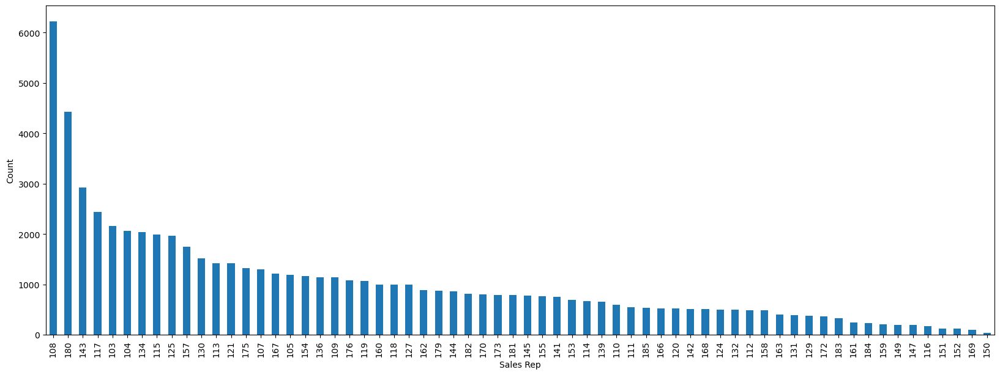

In [54]:
plt.figure(figsize=(20, 7))
sales_data2['Sales Rep'].value_counts().plot.bar()
plt.xlabel('Sales Rep')
plt.ylabel('Count')

Yearly-Monthwise Records:

In [56]:
Yearly_Monthwise_Sales = sales_data2.groupby(['Invoice_Year','Invoice_Month']).sum().reset_index()
Yearly_Monthwise_Sales.iloc[:,6:].describe()

,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,27.000000,2.700000e+01,27.000000
mean,6.895606e+06,1.138197e+07,4.486368e+06,2.879604e+06,4.016002e+06,332258.740741,1.244452e+06,685915.941546
std,1.143812e+06,2.220965e+06,1.231585e+06,5.152791e+05,6.506092e+05,55396.534583,2.116445e+05,117490.201952
min,3.187481e+06,4.900167e+06,1.712686e+06,1.290189e+06,1.897292e+06,130314.000000,5.042254e+05,270807.438237
25%,6.461181e+06,1.077866e+07,4.024413e+06,2.622197e+06,3.688586e+06,306638.500000,1.143268e+06,620357.646119
50%,6.895858e+06,1.152212e+07,4.797025e+06,2.882060e+06,4.092856e+06,339909.000000,1.259842e+06,696506.820155
75%,7.600667e+06,1.278649e+07,5.277200e+06,3.134162e+06,4.370919e+06,366618.000000,1.365313e+06,753245.775603
max,8.786342e+06,1.472000e+07,6.112159e+06,3.810222e+06,5.041842e+06,404709.000000,1.558636e+06,876228.847969


**************************************************Yearly-Monthwise Sales Trend**************************************************


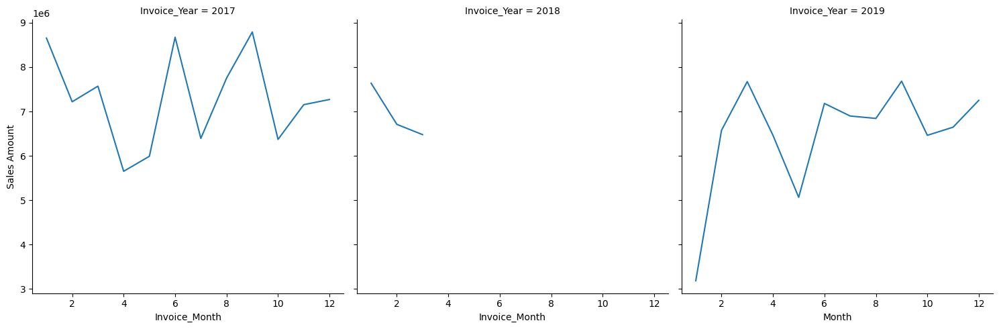

In [57]:
sns.relplot(x ='Invoice_Month',y = 'Sales Amount', data=Yearly_Monthwise_Sales,height=5,
            kind = 'line', aspect = 1, col = 'Invoice_Year')
plt.xlabel('Month')
plt.ylabel('Sales Amount')
print('*'*50+'Yearly-Monthwise Sales Trend'+'*'*50)

1. Considering sales on year-month basis, we can see a fall in sales amount in year 2018.
2. Also the uneven graph in year 2017 and 2019 depicts that there was no consistency in sales.
3. In year 2017, there has been a sharp rise and fall in sales.
4. In year 2019, in first half there has been an extreme rise in sales and in second half of the year the sales has rised and there is no decrease in sales as compared to year 2017.

<AxesSubplot:xlabel='Sales Amount', ylabel='Count'>

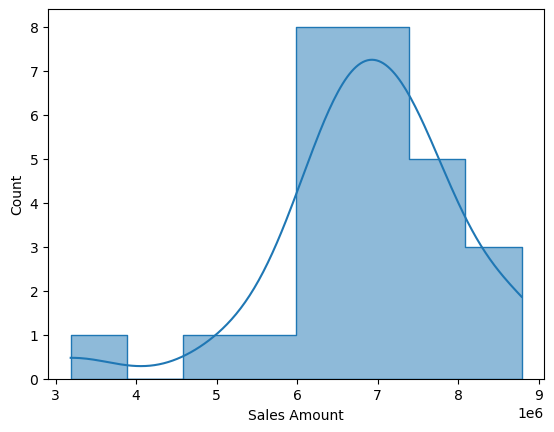

In [61]:
sns.histplot(Yearly_Monthwise_Sales['Sales Amount'],element="step", kde = True)

 Monthly Records:

In [62]:
Monthly_sales = sales_data2.groupby(['Invoice_Year','Invoice_Month', 'Invoice_Day']).sum().reset_index()
Monthly_sales.iloc[:,5:].describe()

,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,559.000000,5.590000e+02,5.590000e+02,5.590000e+02,559.000000,559.000000,559.000000,559.000000,559.000000
mean,5265.107335,3.330615e+05,5.497554e+05,2.166940e+05,139086.442308,193975.037460,16048.275492,60107.716035,33130.108089
std,4781.445858,2.302024e+05,3.889088e+05,1.820144e+05,97025.174636,136009.114595,8052.820326,31837.127941,17179.276121
min,4.000000,5.433650e+03,0.000000e+00,-2.555238e+05,2349.360000,0.000000,345.000000,0.000000,1063.117667
25%,2106.500000,1.572531e+05,2.560595e+05,8.888978e+04,62655.095000,92237.325000,10063.000000,40370.544400,22084.687514
50%,3118.000000,2.688299e+05,4.487250e+05,1.630951e+05,113446.860000,150428.990000,14666.000000,54665.030000,30440.440019
75%,6577.000000,4.696801e+05,7.178838e+05,2.891977e+05,195474.320000,267013.720000,19652.500000,72573.307400,41211.201040
max,23710.000000,1.379283e+06,2.408920e+06,1.029636e+06,619085.330000,760197.860000,55866.000000,231196.720800,128415.923388


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_20904\3736328029.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.relplot(y ='Sales Quantity',x = 'Sales Amount', data=sales_data2,height = 3,aspect=1,


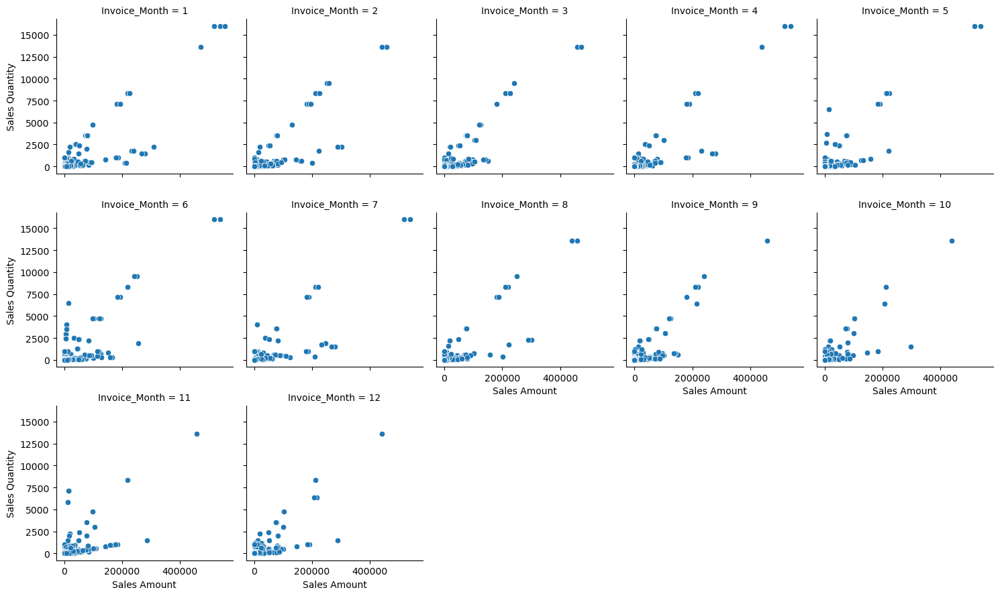

In [29]:
sns.relplot(y ='Sales Quantity',x = 'Sales Amount', data=sales_data2,height = 3,aspect=1,
            col = 'Invoice_Month',col_wrap=5, palette='muted')

In initial months, there has been rise in sales which is then decreased by year end. 

plt.figure(figsize=(2, 9))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data2.query('Invoice_Year == 2017'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2017'+'*'*50)

**************************************************Monthly Sales Trend in 2018**************************************************


<Figure size 200x900 with 0 Axes>

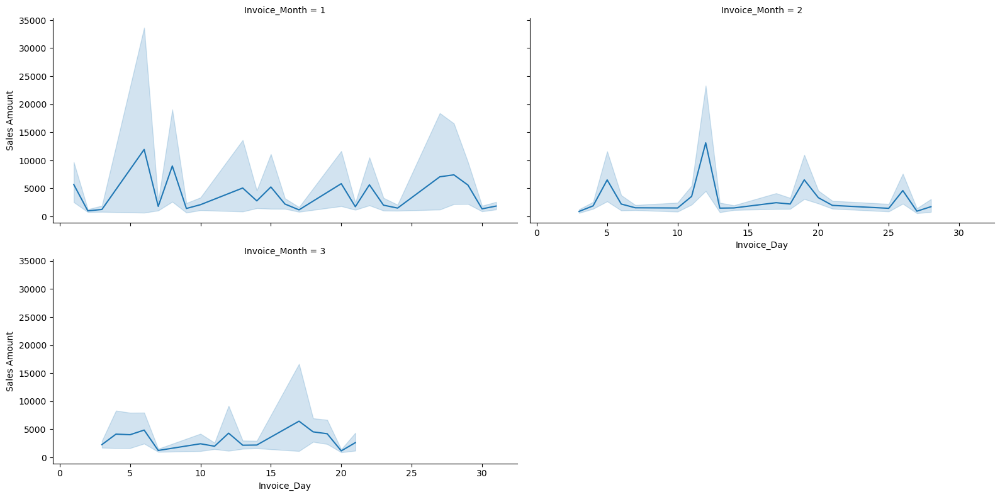

In [70]:
plt.figure(figsize=(2, 9))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data2.query('Invoice_Year == 2018'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2018'+'*'*50)

For year 2018, mid-month has been happening for sales are there has been most sales done.

**************************************************Monthly Sales Trend in 2019**************************************************


<Figure size 200x900 with 0 Axes>

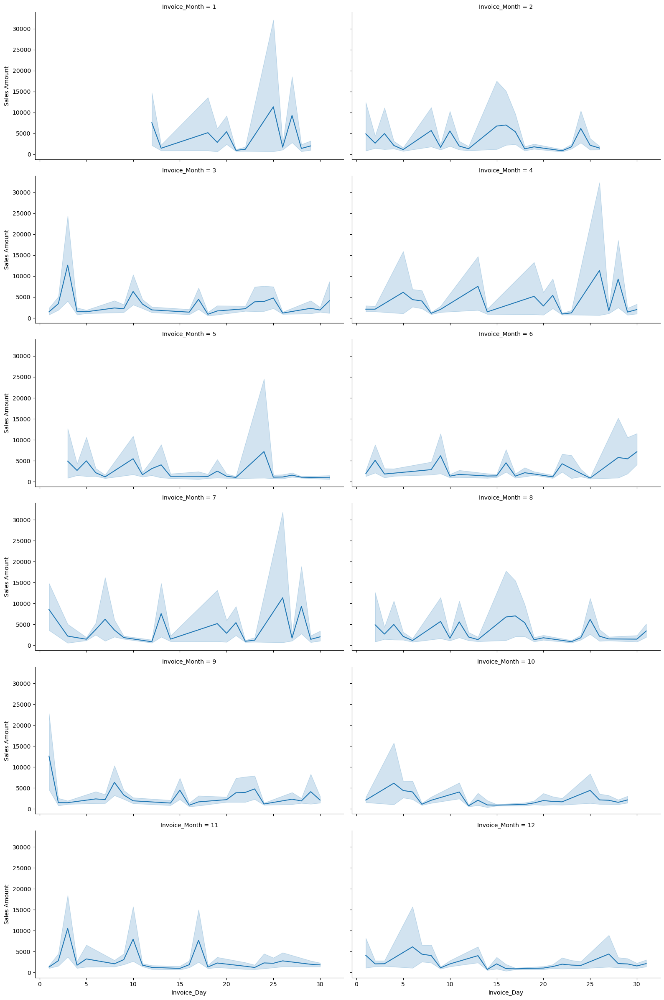

In [71]:
plt.figure(figsize=(2,9))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data2.query('Invoice_Year == 2019'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2019'+'*'*50)

For year 2019, the graph is uneven has there has been continuous increase and decrease in the sales.

#### From above EDA, we can conclude that Year 2019 has the highest sales amount following by year 2017 and 2018. 